In [452]:
# from gerador5 import pipeline_completo

In [453]:
import pandas as pd
import seaborn as sns

In [454]:
dados2 = pd.read_csv('../data/flights4.csv')

In [455]:
dados = pd.read_csv('../data/flights6.csv')

In [456]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay
0,10,ZV,Airbus A320,schengen,XVN,10.854726,12.854726,0,2010,False,29.927574
1,8,SN,Airbus A320,schengen,MRD,8.713161,11.713161,0,2010,False,28.503632
2,9,SN,Boeing 737,non-schengen,GXM,15.277793,19.277793,0,2010,False,42.921002
3,13,SN,Airbus A320,schengen,YGM,17.179997,21.179997,0,2010,False,8.345639
4,16,SN,Boeing 777,schengen,GMM,9.116774,11.116774,0,2010,False,9.008649
...,...,...,...,...,...,...,...,...,...,...,...
71170,18,ZV,Boeing 787,schengen,MRD,9.163440,12.163440,364,2022,False,30.628853
71171,22,SN,Boeing 777,schengen,YGM,9.751651,13.751651,364,2022,False,18.742109
71172,14,SN,Airbus A320,schengen,GXM,8.742196,13.742196,364,2022,False,34.817941
71173,6,BV,Boeing 737,schengen,MRD,15.221966,18.221966,364,2022,False,123.298256


In [457]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71175 entries, 0 to 71174
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   flight_id       71175 non-null  int64  
 1   airline         71175 non-null  object 
 2   aircraft_type   71175 non-null  object 
 3   schengen        71175 non-null  object 
 4   origin          71175 non-null  object 
 5   arrival_time    71175 non-null  float64
 6   departure_time  71175 non-null  float64
 7   day             71175 non-null  int64  
 8   year            71175 non-null  int64  
 9   is_holiday      71175 non-null  bool   
 10  delay           71175 non-null  float64
dtypes: bool(1), float64(3), int64(3), object(4)
memory usage: 5.5+ MB


In [458]:
#calculate the delay
# dados['delay'] = (dados['actual_arrival_time'] - dados['arrival_time']) * 60

In [459]:
dados['delay']

0         29.927574
1         28.503632
2         42.921002
3          8.345639
4          9.008649
            ...    
71170     30.628853
71171     18.742109
71172     34.817941
71173    123.298256
71174     35.908675
Name: delay, Length: 71175, dtype: float64

In [460]:
from datetime import datetime, timedelta

In [461]:
def convert_day_to_date(day, year):
    base_date = datetime(year=year, month=1, day=1)
    target_date = base_date + timedelta(days=day)
    return target_date.strftime('%Y-%m-%d')  # Format the date as desired

# Convert 'day' column to regular dates
dados['date'] = dados.apply(lambda row: convert_day_to_date(row['day'], row['year']), axis=1)

In [462]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,delay,date
0,10,ZV,Airbus A320,schengen,XVN,10.854726,12.854726,0,2010,False,29.927574,2010-01-01
1,8,SN,Airbus A320,schengen,MRD,8.713161,11.713161,0,2010,False,28.503632,2010-01-01
2,9,SN,Boeing 737,non-schengen,GXM,15.277793,19.277793,0,2010,False,42.921002,2010-01-01
3,13,SN,Airbus A320,schengen,YGM,17.179997,21.179997,0,2010,False,8.345639,2010-01-01
4,16,SN,Boeing 777,schengen,GMM,9.116774,11.116774,0,2010,False,9.008649,2010-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...
71170,18,ZV,Boeing 787,schengen,MRD,9.163440,12.163440,364,2022,False,30.628853,2022-12-31
71171,22,SN,Boeing 777,schengen,YGM,9.751651,13.751651,364,2022,False,18.742109,2022-12-31
71172,14,SN,Airbus A320,schengen,GXM,8.742196,13.742196,364,2022,False,34.817941,2022-12-31
71173,6,BV,Boeing 737,schengen,MRD,15.221966,18.221966,364,2022,False,123.298256,2022-12-31


In [463]:
import plotly.express as px

In [464]:
px.line(dados[dados['year']==2018], x = 'date', y = 'delay', color = 'airline')

In [465]:
#compare two histograms from dados and dados2
fig = px.histogram(dados2, x = 'delay', histnorm = 'probability density', nbins = 100, opacity = 0.5, color_discrete_sequence = ['red'], title = 'Dados')
fig.add_vline(x = dados2['delay'].mean(), line_width = 3, line_dash = 'dash', line_color = 'black')
fig.add_vline(x = dados2['delay'].median(), line_width = 3, line_dash = 'dash', line_color = 'green')
fig.add_vline(x = dados2['delay'].mode()[0], line_width = 3, line_dash = 'dash', line_color = 'blue')
fig.show()

In [466]:
#compare two histograms from dados and dados2
fig = px.histogram(dados, x = 'delay', histnorm = 'probability density', nbins = 100, opacity = 0.5, color_discrete_sequence = ['red'], title = 'Dados')
fig.add_vline(x = dados['delay'].mean(), line_width = 3, line_dash = 'dash', line_color = 'black')
fig.add_vline(x = dados['delay'].median(), line_width = 3, line_dash = 'dash', line_color = 'green')
fig.add_vline(x = dados['delay'].mode()[0], line_width = 3, line_dash = 'dash', line_color = 'blue')
fig.show()

In [467]:
px.histogram(dados, x = 'delay', color = 'airline')

In [468]:
px.histogram(dados, x = 'delay', color = 'aircraft_type')

In [469]:
px.histogram(dados, x = 'delay', color = 'origin')

In [470]:
px.histogram(dados, x = 'delay', color = 'schengen')

In [471]:
dados['airline'].value_counts()

airline
SN    56904
ZV     9596
BV     4675
Name: count, dtype: int64

In [472]:
dados2.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320    14.619329
Airbus A330    18.453126
Boeing 737     18.105591
Boeing 777     28.754074
Boeing 787      6.050397
Name: delay, dtype: float64

In [473]:
dados2.groupby('origin')['delay'].mean()

origin
BYU    12.671492
ESB    38.448019
GXN     9.075506
JRT    24.759992
LZW     2.374455
NBI    21.873546
NNN    23.106483
PWR    -2.486139
YKZ    11.725588
YOG    -2.088816
Name: delay, dtype: float64

In [474]:
dados.groupby('origin')['delay'].mean()

origin
FES    11.967759
GMM    -3.806009
GXM    24.243547
MRD    25.322608
NTY     5.098956
UQG    14.374112
XVN    15.516269
YGM    -1.367936
ZIU    37.595146
Name: delay, dtype: float64

In [475]:
dados.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320     21.065505
Airbus A330     -0.713218
Boeing 737      46.073968
Boeing 777      10.142535
Boeing 787       7.872587
Embraer E175     4.035233
Name: delay, dtype: float64

In [476]:
dados.groupby('airline')['delay'].mean()

airline
BV    62.998776
SN    16.905455
ZV    10.144799
Name: delay, dtype: float64

In [477]:
# sns.countplot(dados['airline'])

In [478]:
dados['aircraft_type'].value_counts()

aircraft_type
Airbus A320     35604
Boeing 737       9453
Boeing 777       9438
Boeing 787       7224
Airbus A330      4728
Embraer E175     4728
Name: count, dtype: int64

In [479]:
# sns.countplot(dados['aircraft_type'])

In [480]:
dados['origin'].value_counts()

origin
GXM    18865
MRD    14156
ZIU     9650
UQG     7118
GMM     7086
YGM     4749
FES     4723
XVN     2424
NTY     2404
Name: count, dtype: int64

In [481]:
# sns.countplot(dados['origin'])

In [482]:
dados['schengen'].value_counts(normalize= True)

schengen
schengen        0.800267
non-schengen    0.199733
Name: proportion, dtype: float64

In [483]:
# sns.countplot(dados['schengen'])

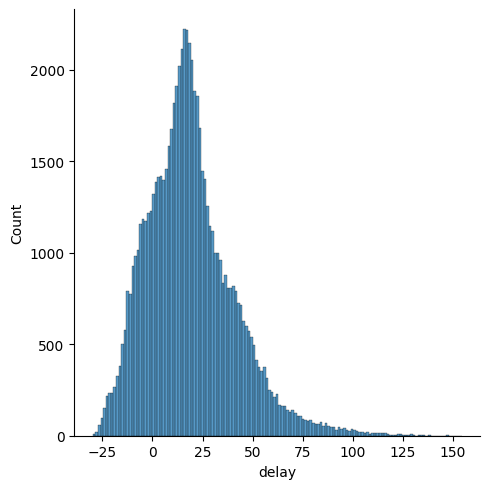

In [484]:
sns.displot(dados['delay'])

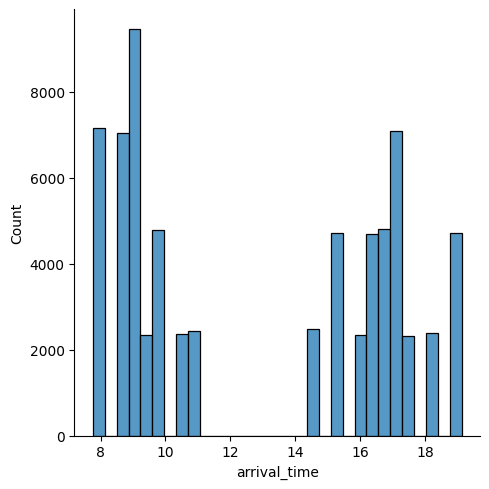

In [485]:
sns.displot(dados['arrival_time'])

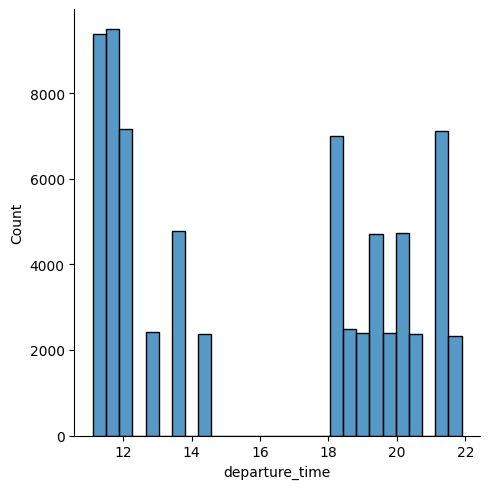

In [486]:
sns.displot(dados['departure_time'])

<Axes: >

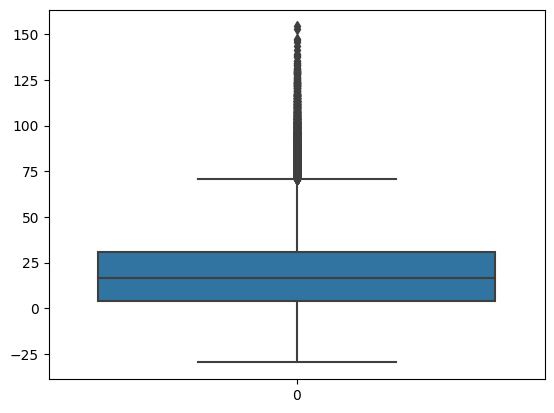

In [487]:
sns.boxplot(dados['delay'])